In [1]:
import glob
import os
from scipy import io
%matplotlib inline
import matplotlib.pylab as plt
import scanpy as sc
import pandas as pd

In [18]:
!pwd

/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/notebook/With_Ribosom/Cancer_Research_Revision_Notebooks/github_notebooks


In [4]:
organoid = sc.read_h5ad(
    'scanpy_objects/organoid.h5ad'
)

In [6]:
organoid.obs.head()

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,integrated_snn_res.0.5,seurat_clusters,annot
AAACCCAAGCGTCAGA-1_1,no_6_PT,4008.0,1813,4.316367,2,2,2
AAACCCAAGGGCTAAC-1_1,no_6_PT,4365.0,2085,3.069874,5,5,5
AAACCCAAGTGATAAC-1_1,no_6_PT,3649.0,1603,3.644834,0,0,0
AAACCCACAATCGCGC-1_1,no_6_PT,7487.0,3030,3.058635,1,1,1
AAACCCACACCTGAAT-1_1,no_6_PT,5917.0,2374,3.785702,2,2,2


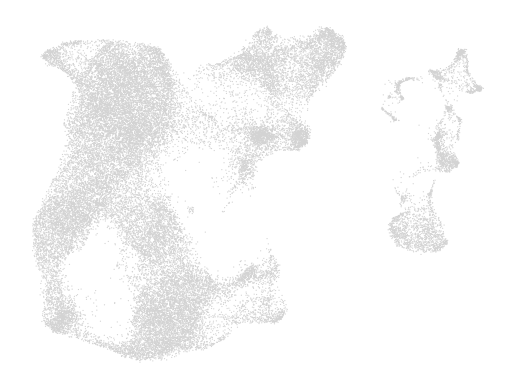

In [5]:
sc.pl.umap(
    organoid,
    frameon=False
)

In [7]:
marker_genes = pd.read_excel(
    '../spread_sheets/organoid_markers.xlsx')

In [8]:
marker_genes.loc[:,'Gene'][0] = 'mycn---MYCN'

[<Axes: title={'center': 'mycn---MYCN'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Phox2b'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Isl1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Nefl'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Th'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Caly'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Chga'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Ccnd1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Rrm2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Hist1h1b'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Mki67'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Top2a'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Cdk1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Prc1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Aspm'}, xlabel='UMAP1'

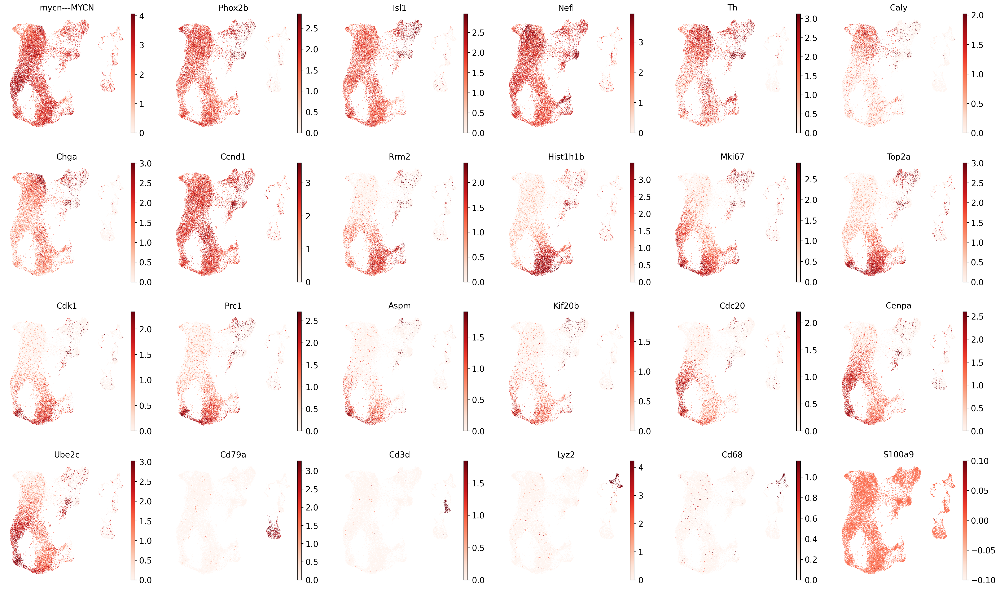

In [10]:
from matplotlib.pyplot import rc_context

sc.set_figure_params(dpi=100, color_map = 'Reds')
sc.pl.umap(organoid, 
           color = marker_genes['Gene'].values,
           use_raw=False, s = 1.4,
           frameon = False, ncols = 6, vmax = 'p99',
           show = False
          )

In [12]:
furlan_df = pd.read_excel(
    'Furlan2017_signature.xlsx')

hen_df = pd.read_excel(
    'Hanemaaijer2021_signature.xlsx')

# kam_df = pd.read_excel(
#     '/home/hsarkar/Projects/neuroblastoma_analysis/spread_sheet/Figure2A_20220628_Kameneva2021_signature.xlsx')

kam_df = pd.read_excel(
    'Kameneva2021_signature.xlsx')

In [13]:
furlan_dict = furlan_df.groupby('Annotation')['Gene'].apply(list).to_dict()
hen_dict = hen_df.groupby('Annotation')['Gene'].apply(list).to_dict()
kam_dict = kam_df.groupby('Annotation')['Gene'].apply(list).to_dict()

In [14]:
data_src = {}
data_src['Furlan'] = furlan_dict
data_src['Hanemaaijer'] = hen_dict
data_src['Kameneva'] = kam_dict

In [15]:
for k in data_src:
    for ctype in data_src[k]:
        print(k,ctype)
        gene_list = data_src[k][ctype]
        gene_list = list(set(gene_list).intersection(set(organoid.var_names)))
        if len(gene_list) < 10:
            ctrl_size = 20
        else:
            ctrl_size = len(gene_list)
        if len(gene_list) > 0:
            sc.tl.score_genes(organoid, 
                              gene_list, 
                              score_name=k + '_' + ctype,
                              ctrl_size = ctrl_size,
                              use_raw=False
                             )

Furlan Bridge
Furlan Chromaffin
Furlan SCP
Furlan Sympathoblasts
Hanemaaijer Bridge
Hanemaaijer Committed Progenitors
Hanemaaijer E chromaffin
Hanemaaijer N chromaffin
Hanemaaijer Neuroblast
Hanemaaijer Pre−E Chromaffin
Hanemaaijer SCP
Kameneva Bridge
Kameneva Chromaffin
Kameneva SCP
Kameneva Sympathoblasts


In [16]:
selected_types = [
     'Furlan_SCP',
'Furlan_Bridge',
 'Furlan_Chromaffin',
 'Furlan_Sympathoblasts',
 'Hanemaaijer_SCP',
 'Hanemaaijer_Committed Progenitors',
 'Hanemaaijer_E chromaffin',
 'Hanemaaijer_Neuroblast',
 'Kameneva_SCP',
 'Kameneva_Bridge',
 'Kameneva_Chromaffin',
 'Kameneva_Sympathoblasts']

## Figure 5A

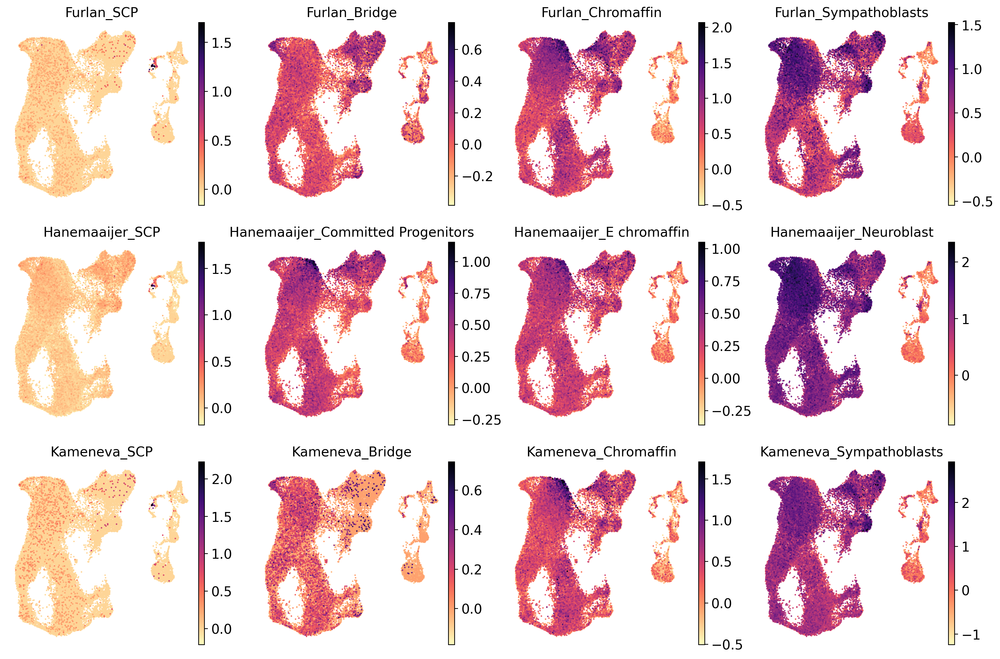

In [17]:
from matplotlib.pyplot import rc_context

sc.set_figure_params(dpi=100, color_map = 'magma_r')

fig, ax = plt.subplots(3,4,figsize=(18,12))

for i in range(len(selected_types)):
    r = int(i/4)
    c = i % 4
    sc.pl.umap(
        organoid, 
        color=selected_types[i],
        ax = ax[r,c],
        show = False,
        use_raw=False, 
        s = 10, 
        frameon = False, 
        ncols = 3,
        title = selected_types[i]
        #vmax = 'p99'
    )